## Tomato Pollination Example

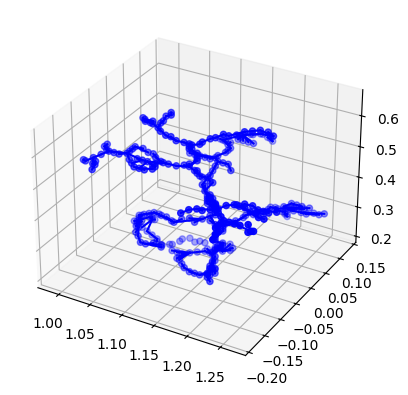

In [1]:
import numpy as np
import time
import dismech

geom = dismech.GeomParams(
    rod_r0=2e-2,
    shell_h=0.0,
)

material = dismech.Material(density=1500,
                            youngs_rod=3.16e7,
                            youngs_shell=0,
                            poisson_rod=0.5,
                            poisson_shell=0)

dyn_sim = dismech.SimParams(static_sim=False,
                                  two_d_sim=True,   # no twisting
                                  use_mid_edge=False,
                                  use_line_search=False,
                                  show_floor=False,
                                  log_data=True,
                                  log_step=1,
                                  dt=1e-2,
                                  max_iter=50,
                                  total_time=1,
                                  plot_step=1,
                                  tol=1e-4,
                                  ftol=1e-4,
                                  dtol=1e-2
                                  )

env = dismech.Environment()
# env.add_force('gravity', g=np.array([0.0, 0.0, -9.81]))
# env.add_force('damping', eta=100)

# geo = dismech.Geometry.from_txt(
#     '../tests/resources/tomato_pollination/input_new.txt')
geo = dismech.Geometry.from_txt(
    '../tests/resources/tomato_pollination/input_final copy.txt')

robot = dismech.SoftRobot(geom, material, geo, dyn_sim, env)

In [2]:
print(robot.q0[robot.map_node_to_dof(5)])

[ 1.162693 -0.074231  0.219337]


### Time Stepping

Move the stem: Moving BC

In [3]:
import numpy as np

base_nodes = np.where((robot.state.q[robot.node_dof_indices].reshape(-1, 3)[:, 2]) < 0.234)[0]
more_base_nodes_to_fix = [ 
                          42, 48, 47, 46, 49, 52, 39, 43, 55, 59]
# find nodes that are not connected to any other nodes
all_nodes = np.arange(robot.n_nodes)
# find the nodes that are not present in robot.edges
connected_nodes = np.unique(robot.edges)
unconnected_nodes = np.setdiff1d(all_nodes, connected_nodes)
print("unconnected nodes:", unconnected_nodes)

nodes_to_fix = np.unique(np.concatenate((base_nodes, unconnected_nodes, more_base_nodes_to_fix)))


unconnected nodes: [15 20 26 27 29 30 32 33 34]


1. Move the base

In [4]:
# ##################################################################################
# # --- pick the main grip node robustly ---
# grasping_point = np.array([1.162693, -0.026231, 0.275337])
# xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

# # Either: strict threshold match (can be empty or multiple)
# candidates = np.where(np.linalg.norm(xyz - grasping_point, axis=1) < 1e-4)[0]

# if candidates.size == 0:
#     # Fallback: nearest node
#     main_grip = int(np.argmin(np.linalg.norm(xyz - grasping_point, axis=1)))
# else:
#     # If multiple, choose the nearest among matches
#     main_grip = int(candidates[np.argmin(np.linalg.norm(xyz[candidates] - grasping_point, axis=1))])

# other_grip_nodes = np.array([45, 57, 51, 54, 41, 63, 61, 60], dtype=int)
# other_grip_nodes_above = np.array([82, 74, 69], dtype=int)

# # Keep an explicit order: main first, then others (unique, no sorting)
# grip_nodes = np.unique(np.r_[main_grip, other_grip_nodes]).astype(int)
# # Optional: ensure main_grip is at index 0 even if it was in other_grip_nodes
# if grip_nodes[0] != main_grip:
#     # move main to front
#     idx_main = int(np.where(grip_nodes == main_grip)[0][0])
#     grip_nodes = np.r_[main_grip, np.delete(grip_nodes, idx_main)]


# # Fix: grip nodes + root nodes (if that's what you want fixed)
# robot = robot.fix_nodes(np.unique(np.r_[main_grip, nodes_to_fix]))

# # --- define the distributed shaking on grip nodes only ---
# def shake_distributed(robot: dismech.SoftRobot, t: float):
#     """Moving boundary condition on grip_nodes with linearly scaled amplitudes."""
#     amplitude = 0.001  # meters at main grip node
#     frequency = 5.0    # Hz

#     xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

#     # Reference length: distance main <-> first stationary node in your list
#     # If you meant a specific stationary anchor, pick it explicitly; here we use the
#     # first of your "other" nodes that exists.

#     L_ref = np.linalg.norm(xyz[main_grip] - xyz[grip_nodes[1]])

#     # Build amplitudes aligned to grip_nodes order
#     all_grip_nodes = np.r_[grip_nodes, other_grip_nodes_above]
#     amps = np.empty(all_grip_nodes.size, dtype=float)
#     amps[0] = amplitude  # main node
#     for i in range(1, grip_nodes.size):
#         dist = np.linalg.norm(xyz[grip_nodes[1]] - xyz[grip_nodes[i]])
#         amps[i] = amplitude * (dist / L_ref)

#     # Also move the "above" nodes half amplitude
#     L_ref_above = np.linalg.norm(xyz[main_grip] - xyz[other_grip_nodes_above[0]])
#     for node in other_grip_nodes_above:
#         dist = np.linalg.norm(xyz[other_grip_nodes_above[0]] - xyz[node])
#         amps[i+1] = amplitude * (dist / L_ref_above)
#         i = i + 1

#     # print("Amplitudes:", amps)
#     # print("Grip nodes:", all_grip_nodes)
    
#     # Sinusoidal displacement along +X
#     disp_x = amps * np.sin(2 * np.pi * frequency * t)
#     disp = np.column_stack([disp_x, np.zeros_like(disp_x), np.zeros_like(disp_x)])  # (N,3)

#     # Move ONLY the grip nodes (root nodes are already fixed)
#     robot = robot.move_nodes(all_grip_nodes, disp.reshape(-1,1).flatten())
#     return robot

# stepper = dismech.ImplicitEulerTimeStepper(robot)
# stepper.before_step = shake_distributed

2. Move the middle

In [5]:
# # --- pick the main grip node robustly ---
# grasping_point = np.array([1.154693, -0.034231, 0.395337])
# xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

# # Either: strict threshold match (can be empty or multiple)
# candidates = np.where(np.linalg.norm(xyz - grasping_point, axis=1) < 1e-4)[0]

# if candidates.size == 0:
#     # Fallback: nearest node
#     main_grip = int(np.argmin(np.linalg.norm(xyz - grasping_point, axis=1)))
# else:
#     # If multiple, choose the nearest among matches
#     main_grip = int(candidates[np.argmin(np.linalg.norm(xyz[candidates] - grasping_point, axis=1))])

# other_grip_nodes = np.array([139, 143, 144, 145], dtype=int)
# other_grip_nodes_above = np.array([151, 150, 149, 148, 147], dtype=int)

# # Keep an explicit order: main first, then others (unique, no sorting)
# grip_nodes = np.unique(np.r_[main_grip, other_grip_nodes]).astype(int)
# # Optional: ensure main_grip is at index 0 even if it was in other_grip_nodes
# if grip_nodes[0] != main_grip:
#     # move main to front
#     idx_main = int(np.where(grip_nodes == main_grip)[0][0])
#     grip_nodes = np.r_[main_grip, np.delete(grip_nodes, idx_main)]


# # Fix: grip nodes + root nodes (if that's what you want fixed)
# robot = robot.fix_nodes(np.unique(np.r_[main_grip, nodes_to_fix]))

# # --- define the distributed shaking on grip nodes only ---
# def shake_distributed(robot: dismech.SoftRobot, t: float):
#     """Moving boundary condition on grip_nodes with linearly scaled amplitudes."""
#     amplitude = 0.004  # meters at main grip node
#     frequency = 5.0    # Hz

#     xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

#     # Reference length: distance main <-> first stationary node in your list
#     # If you meant a specific stationary anchor, pick it explicitly; here we use the
#     # first of your "other" nodes that exists.

#     L_ref = np.linalg.norm(xyz[main_grip] - xyz[grip_nodes[1]])

#     # Build amplitudes aligned to grip_nodes order
#     all_grip_nodes = np.r_[grip_nodes, other_grip_nodes_above]
#     amps = np.empty(all_grip_nodes.size, dtype=float)
#     amps[0] = amplitude  # main node
#     for i in range(1, grip_nodes.size):
#         dist = np.linalg.norm(xyz[grip_nodes[1]] - xyz[grip_nodes[i]])
#         amps[i] = amplitude * (dist / L_ref)

#     # Also move the "above" nodes half amplitude
#     L_ref_above = np.linalg.norm(xyz[main_grip] - xyz[other_grip_nodes_above[0]])
#     for node in other_grip_nodes_above:
#         dist = np.linalg.norm(xyz[other_grip_nodes_above[0]] - xyz[node])
#         amps[i+1] = amplitude * (dist / L_ref_above)
#         i = i + 1

#     # print("Amplitudes:", amps)
#     # print("Grip nodes:", all_grip_nodes)
    
#     # Sinusoidal displacement along +X
#     disp_x = amps * np.sin(2 * np.pi * frequency * t)
#     disp = np.column_stack([disp_x, np.zeros_like(disp_x), np.zeros_like(disp_x)])  # (N,3)

#     # Move ONLY the grip nodes (root nodes are already fixed)
#     robot = robot.move_nodes(all_grip_nodes, disp.reshape(-1,1).flatten())
#     return robot

# stepper = dismech.ImplicitEulerTimeStepper(robot)
# stepper.before_step = shake_distributed

3. Move the top

In [6]:
# --- pick the main grip node robustly ---
grasping_point = np.array([1.122693, -0.050231, 0.595337])
xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

# Either: strict threshold match (can be empty or multiple)
candidates = np.where(np.linalg.norm(xyz - grasping_point, axis=1) < 1e-4)[0]

if candidates.size == 0:
    # Fallback: nearest node
    main_grip = int(np.argmin(np.linalg.norm(xyz - grasping_point, axis=1)))
else:
    # If multiple, choose the nearest among matches
    main_grip = int(candidates[np.argmin(np.linalg.norm(xyz[candidates] - grasping_point, axis=1))])

other_grip_nodes = np.array([288, 293, 292, 291, 290, 289], dtype=int)
other_grip_nodes_above = np.array([296], dtype=int)

# Keep an explicit order: main first, then others (unique, no sorting)
grip_nodes = np.unique(np.r_[main_grip, other_grip_nodes]).astype(int)
# Optional: ensure main_grip is at index 0 even if it was in other_grip_nodes
if grip_nodes[0] != main_grip:
    # move main to front
    idx_main = int(np.where(grip_nodes == main_grip)[0][0])
    grip_nodes = np.r_[main_grip, np.delete(grip_nodes, idx_main)]


# Fix: grip nodes + root nodes (if that's what you want fixed)
robot = robot.fix_nodes(np.unique(np.r_[main_grip, nodes_to_fix]))

# --- define the distributed shaking on grip nodes only ---
def shake_distributed(robot: dismech.SoftRobot, t: float):
    """Moving boundary condition on grip_nodes with linearly scaled amplitudes."""
    amplitude = 0.0005  # meters at main grip node
    frequency = 5.0    # Hz

    xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

    # Reference length: distance main <-> first stationary node in your list
    # If you meant a specific stationary anchor, pick it explicitly; here we use the
    # first of your "other" nodes that exists.

    L_ref = np.linalg.norm(xyz[main_grip] - xyz[grip_nodes[1]])

    # Build amplitudes aligned to grip_nodes order
    all_grip_nodes = np.r_[grip_nodes, other_grip_nodes_above]
    amps = np.empty(all_grip_nodes.size, dtype=float)
    amps[0] = amplitude  # main node
    for i in range(1, grip_nodes.size):
        dist = np.linalg.norm(xyz[grip_nodes[1]] - xyz[grip_nodes[i]])
        amps[i] = amplitude * (dist / L_ref)

    # Also move the "above" nodes half amplitude
    L_ref_above = np.linalg.norm(xyz[main_grip] - xyz[other_grip_nodes_above[0]])
    for node in other_grip_nodes_above:
        dist = np.linalg.norm(xyz[other_grip_nodes_above[0]] - xyz[node])
        amps[i+1] = amplitude * (dist / L_ref_above)
        i = i + 1

    print("Amplitudes:", amps)
    print("Grip nodes:", all_grip_nodes)
    
    # Sinusoidal displacement along +X
    disp_x = amps * np.sin(2 * np.pi * frequency * t)
    disp = np.column_stack([disp_x, np.zeros_like(disp_x), np.zeros_like(disp_x)])  # (N,3)

    # Move ONLY the grip nodes (root nodes are already fixed)
    robot = robot.move_nodes(all_grip_nodes, disp.reshape(-1,1).flatten())
    return robot

stepper = dismech.ImplicitEulerTimeStepper(robot)
stepper.before_step = shake_distributed

In [7]:
print("grasping point:", grip_nodes)

grasping point: [294 288 289 290 291 292 293]


In [8]:
# simulate
robots = stepper.simulate()

qs = np.stack([robot.state.q for robot in robots])

Amplitudes: [5.00000000e-04 0.00000000e+00 9.62250449e-05 2.15165741e-04
 3.19142369e-04 4.08248290e-04 5.27046277e-04 0.00000000e+00]
Grip nodes: [294 288 289 290 291 292 293 296]
iter: 1, error: 6029.190
iter: 2, error: 54.151
current_time:  0.01
Amplitudes: [5.00000000e-04 0.00000000e+00 9.63075100e-05 2.15110147e-04
 3.19098331e-04 4.08235014e-04 5.27004100e-04 0.00000000e+00]
Grip nodes: [294 288 289 290 291 292 293 296]
iter: 1, error: 11465.846
iter: 2, error: 427.069
iter: 3, error: 22.910
current_time:  0.02
Amplitudes: [5.00000000e-04 0.00000000e+00 9.64130310e-05 2.15036962e-04
 3.19040493e-04 4.08217691e-04 5.26948949e-04 0.00000000e+00]
Grip nodes: [294 288 289 290 291 292 293 296]
iter: 1, error: 15812.295
iter: 2, error: 476.607
iter: 3, error: 37.525
current_time:  0.03
Amplitudes: [5.00000000e-04 0.00000000e+00 9.65260362e-05 2.14955630e-04
 3.18976347e-04 4.08198649e-04 5.26888576e-04 0.00000000e+00]
Grip nodes: [294 288 289 290 291 292 293 296]
iter: 1, error: 18653.

In [9]:
t = np.arange(robot.sim_params.total_time, step=robot.sim_params.dt)
options = dismech.AnimationOptions(title='Tomato plant')

fig = dismech.get_interactive_animation_plotly(robot, t, qs , options)
fig.show()

100


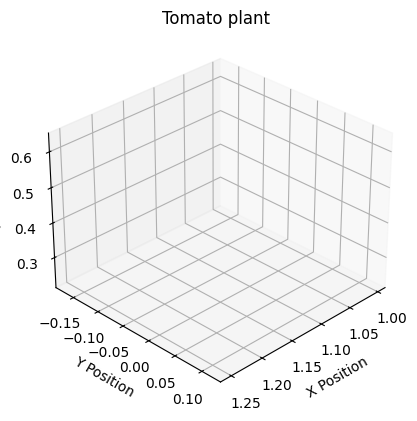

In [10]:
ani = dismech.get_animation(robot, t, qs, options)
ani.save('tomato.gif')

Estimated values of parameters

In [11]:
L = 0.292 # m
r0 = 0.0059 # m

delta = 0.054 # m # delta = PL^3/(3EI)
P = 0.02*9.81 # N

K = P/delta # effective stiffness

I = np.pi * r0**4 / 4
E = P*(L**3) / (3 * I * delta)

print("E:", E)

f = 1.38 # Hz
TP = 0.725 # s

omega = 2 * np.pi * f
m_eff = K / omega**2
print("m_eff:", m_eff)

# estimate density
V = np.pi * r0**2 * L
rho = m_eff / V
print("rho:", rho)

E: 31683606.79586816
m_eff: 0.048326721526529885
rho: 1513.389046285066
